In [1]:
%load_ext autoreload
%autoreload 2

import pymc as pm
import seaborn as sns
import pandas as pd
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
import numpy as np
import arviz as az
from matplotlib import pyplot as plt

import sys
sys.path.append('..')
from pfas_prep import PFAS
from PyPKMC import PyPKMC
import register_pfas_data as rpd

In [2]:
chemical = 'PFDA'
pfas_db = '../PFAS.db'
pfas_tmp = PFAS(pfas_db, pfas_file = '../auxiliary/pfas_master.csv')#, hero_only=1289834) # 
Vdss_prior = {'mu': -1.5, 'sd': 1.5}
CLC_prior = {'mu': -2.89, 'sd': 2.68}
load_trace = True

# Rat fits

## Male

First import the data using the old PFAS class

In [3]:
%%time
pfas_male_data = pfas_tmp.get_processed_data(chemical=chemical, sex='Male', species='rat')
pfas_male_data.head()

Hero ID available:  [3858670 5063958 5916078]
dropping duplicated column
Hero ID used:  [3858670 5063958 5916078]
CPU times: user 555 ms, sys: 2.03 ms, total: 557 ms
Wall time: 558 ms


,hero_id,study_id,animal_id,N_animals,BW,BW_units,BW_init,BW_init_units,species,strain,dose,dose_units,time,time_units,conc_mean,conc_sd,standard_error,conc_units,route,matrix,sex,dtxsid,source,initial_age,initial_age_units,initial_weight,initial_weight_units,n,author,preferred_name,pfas_abbrev,casrn,iupac_name,mapped_dtxsid,n_times,idx1,idx2,idx3,time_cor,dose_cor,time_course,BW_cor,conc_mean_cor,conc_sd_cor,Dss,lod,censored,route_idx,sex_idx,lnconc_sd,lnconc_mean,cv,aidx,dose_mg,dataset_str
0,3858670,5,-1,1,-1.0,NaN,0.600894,NaN,rat,wistar,48.64,umol/kg,3.538931,hour,233.370673,27.638737,0,nmol/ml,iv,plasma,Male,DTXSID3031860,Figure 1B,24.0,months,NaN,Not Reported,3,Ohmori,Perfluorononanoic acid,PFDA,375-95-1,"2,2,3,3,4,4,5,5,6,6,7,7,8,8,9,9,10,10,10-nonad...",DTXSID3031860,13,0,0,0,0.147455,25.005143,730.645055,0.600894,119.972596,14.208688,0.0,-1,0,0,0,0.118021,4.780299,0.118433,False,15.025428,3858670-25.01 mg/kg-iv
1,3858670,5,-1,1,-1.0,NaN,0.600894,NaN,rat,wistar,48.64,umol/kg,29.146271,hour,146.693343,17.363778,0,nmol/ml,iv,plasma,Male,DTXSID3031860,Figure 1B,24.0,months,NaN,Not Reported,3,Ohmori,Perfluorononanoic acid,PFDA,375-95-1,"2,2,3,3,4,4,5,5,6,6,7,7,8,8,9,9,10,10,10-nonad...",DTXSID3031860,13,0,0,0,1.214428,25.005143,731.712028,0.601214,75.412994,8.926475,0.0,-1,0,0,0,0.117956,4.316023,0.118368,False,15.025428,3858670-25.01 mg/kg-iv
2,3858670,5,-1,1,-1.0,NaN,0.600894,NaN,rat,wistar,48.64,umol/kg,55.171023,hour,133.196474,15.792122,0,nmol/ml,iv,plasma,Male,DTXSID3031860,Figure 1B,24.0,months,NaN,Not Reported,3,Ohmori,Perfluorononanoic acid,PFDA,375-95-1,"2,2,3,3,4,4,5,5,6,6,7,7,8,8,9,9,10,10,10-nonad...",DTXSID3031860,13,0,0,0,2.298793,25.005143,732.796393,0.601539,68.474442,8.118509,0.0,-1,0,0,0,0.118149,4.219481,0.118563,False,15.025428,3858670-25.01 mg/kg-iv
3,3858670,5,-1,1,-1.0,NaN,0.600894,NaN,rat,wistar,48.64,umol/kg,96.930406,hour,126.840114,15.013794,0,nmol/ml,iv,plasma,Male,DTXSID3031860,Figure 1B,24.0,months,NaN,Not Reported,3,Ohmori,Perfluorononanoic acid,PFDA,375-95-1,"2,2,3,3,4,4,5,5,6,6,7,7,8,8,9,9,10,10,10-nonad...",DTXSID3031860,13,0,0,0,4.038767,25.005143,734.536367,0.602061,65.206727,7.718381,0.0,-1,0,0,0,0.117956,4.170606,0.118368,False,15.025428,3858670-25.01 mg/kg-iv
4,3858670,5,-1,1,-1.0,NaN,0.600894,NaN,rat,wistar,48.64,umol/kg,149.143246,hour,120.759052,14.325348,0,nmol/ml,iv,plasma,Male,DTXSID3031860,Figure 1B,24.0,months,NaN,Not Reported,3,Ohmori,Perfluorononanoic acid,PFDA,375-95-1,"2,2,3,3,4,4,5,5,6,6,7,7,8,8,9,9,10,10,10-nonad...",DTXSID3031860,13,0,0,0,6.214302,25.005143,736.711902,0.602714,62.080538,7.364461,0.0,-1,0,0,0,0.118213,4.121445,0.118628,False,15.025428,3858670-25.01 mg/kg-iv


### Run the models

#### 1-Compartment model

In [4]:
pfas_male_1cmpt = PyPKMC(pfas_male_data, time_label='time_cor', y_obs_label='conc_mean_cor', sd_obs_label='conc_sd_cor',
                         route_label='route_idx', dose_label='dose_mg', BW_label='BW_cor', 
                         study_label='hero_id', dataset_label='dataset_str', indiv_label='aidx',
                         CLC_prior = CLC_prior, Vdss_prior = Vdss_prior)
pfas_male_1cmpt.sample(model_type='1-compartment', target_accept=0.99, nuts_sampler='numpyro',
                   load_trace=load_trace, tune=10000, draws=5000, likelihood='Lognormal', sample_prior=True, sample_posterior=True)

PFDA_Male_rat_1cmpt
hierarchical model, 1-compartment
Checking metrics...
Pass all metrics = True
Assign pareto...


/data/tzurlind/pkgs/miniforge3/lib/python3.12/site-packages/arviz/plots/traceplot.py:223: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (45), generating only 20 plots
  warnings.warn(
/data/tzurlind/pkgs/miniforge3/lib/python3.12/site-packages/arviz/stats/density_utils.py:488: UserWarning: Your data appears to have a single value or no finite values
  warnings.warn("Your data appears to have a single value or no finite values")


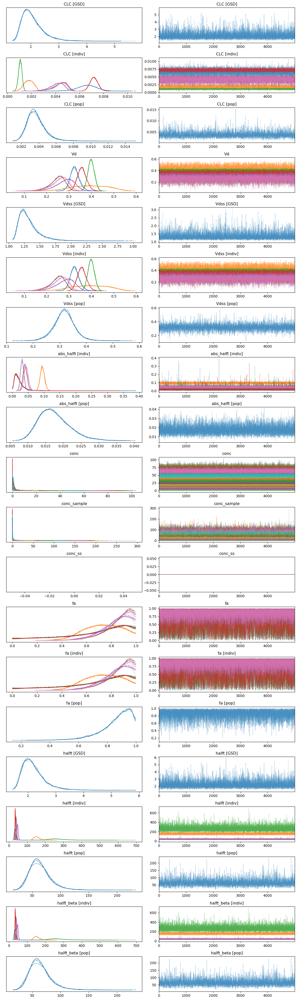

In [5]:
with pfas_male_1cmpt.model:
    az.plot_trace(pfas_male_1cmpt._trace)
    plt.tight_layout()

conc_indiv
conc_summary


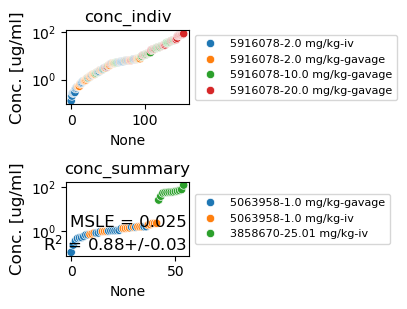

In [6]:
pfas_male_1cmpt.plot_data_ppc(group='posterior', color_dataset=True)

#### 2-Compartment model

In [7]:
pfas_male_2cmpt = PyPKMC(pfas_male_data, time_label='time_cor', y_obs_label='conc_mean_cor', sd_obs_label='conc_sd_cor',
                         route_label='route_idx', dose_label='dose_mg', BW_label='BW_cor', 
                         study_label='hero_id', dataset_label='dataset_str', indiv_label='aidx', Rkcd_SD_prior=1,
                         CLC_prior = CLC_prior, Vdss_prior = Vdss_prior)
pfas_male_2cmpt.sample(model_type='2-compartment', target_accept=0.99, nuts_sampler='numpyro',
                   load_trace=load_trace, tune=10000, draws=10000, likelihood='Lognormal', sample_prior=True, sample_posterior=True)

PFDA_Male_rat_2cmpt
hierarchical model, 2-compartment
Checking metrics...
Pass all metrics = True
Assign pareto...


/data/tzurlind/pkgs/miniforge3/lib/python3.12/site-packages/arviz/plots/traceplot.py:223: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (83), generating only 20 plots
  warnings.warn(


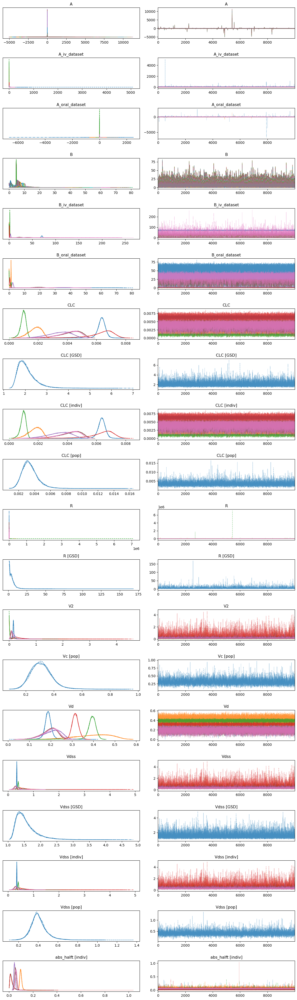

In [8]:
with pfas_male_2cmpt.model:
    az.plot_trace(pfas_male_2cmpt._trace)
    plt.tight_layout()

In [9]:
az.summary(pfas_male_2cmpt._trace, var_names = 'mu_R', hdi_prob=0.9)

,mean,sd,hdi_5%,hdi_95%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu_R,6.791,10.44,0.745,14.533,0.142,0.101,1318.0,5303.0,1.0


conc_indiv
conc_summary


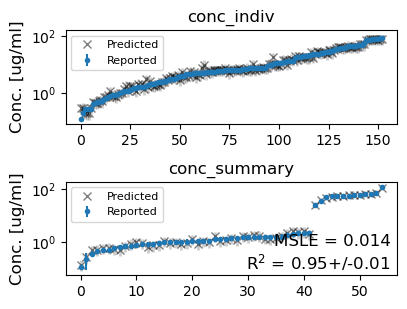

In [10]:
pfas_male_2cmpt.plot_data_ppc(group='posterior')

#### Compare models

/data/tzurlind/pkgs/miniforge3/lib/python3.12/site-packages/arviz/stats/stats.py:789: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(
/data/tzurlind/pkgs/miniforge3/lib/python3.12/site-packages/arviz/stats/stats.py:1024: RuntimeWarning: overflow encountered in exp
  weights = 1 / np.exp(len_scale - len_scale[:, None]).sum(axis=1)
/data/tzurlind/pkgs/miniforge3/lib/python3.12/site-packages/arviz/stats/stats.py:789: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal poster

,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
2_compartment,0,-288.305937,48.451089,0.00000,0.970909,31.063446,0.000000,True,log
1_compartment,1,-344.558016,41.682454,56.25208,0.029091,32.087432,10.820631,True,log


<Axes: title={'center': 'Model comparison\nhigher is better'}, xlabel='elpd_loo (log)', ylabel='ranked models'>

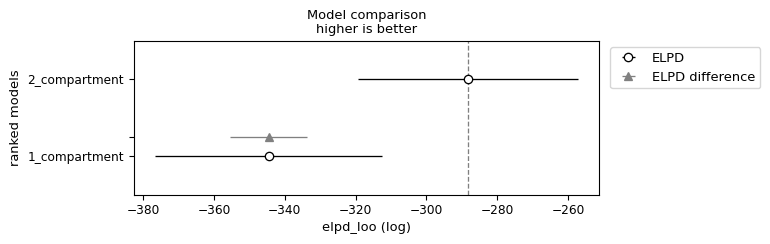

In [11]:
pfas_male_compare = az.compare({"1_compartment": pfas_male_1cmpt._trace, "2_compartment": pfas_male_2cmpt._trace},
                           var_name="combined",ic='loo')
display(pfas_male_compare)
az.plot_compare(pfas_male_compare, insample_dev=False)

#### Define winning model

In [12]:
pfas_male = pfas_male_2cmpt
print(pfas_male.N_divergences)
print(f'Pass all metrics = {pfas_male.pass_all_metrics}')

0
Pass all metrics = True


### Posterior predictive check on winning model

conc_indiv
conc_summary
conc_indiv
conc_summary


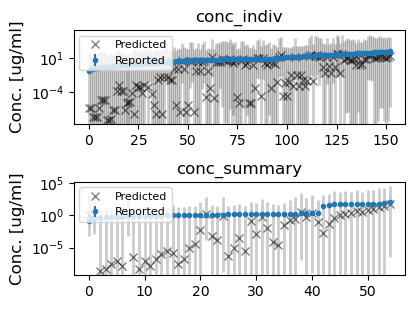

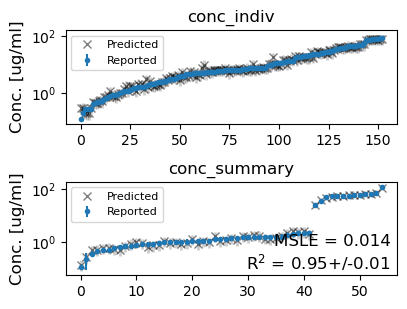

In [13]:
pfas_male.plot_data_ppc(group='prior', savefig=True)
pfas_male.plot_data_ppc(group='posterior', savefig=True)

In [14]:
indiv_summary = pfas_male.get_pk_stats(level='indiv', vol_units='ml')
hero_id = '3858670'
pk_parm = 'Vdss'
dose = '10.0 mg/kg'
#hero_fits = indiv_summary.loc[[x for x in indiv_summary.index if (hero_id in x) & (pk_parm in x)]]
#hero_fits = indiv_summary.loc[[x for x in indiv_summary.index if (hero_id in x)]]# & (dose in x)]]
hero_fits = indiv_summary.loc[[x for x in indiv_summary.index if (pk_parm in x)]]# & (dose in x)]]
for ind, row in hero_fits.iterrows():
    print(ind, "%0.4g (%0.4g - %0.4g)"%(row['mean'], row['hdi_5%'], row['hdi_95%']))

Vdss [indiv][3858670-25.01 mg/kg-iv] 348.7 (335.2 - 359.2)
Vdss [indiv][5063958-1.0 mg/kg-gavage] 482.5 (254.3 - 710.1)
Vdss [indiv][5063958-1.0 mg/kg-iv] 471.7 (369.1 - 672.7)
Vdss [indiv][5916078-2.0 mg/kg-iv] 775.1 (419.7 - 1168)
Vdss [indiv][5916078-2.0 mg/kg-gavage] 385.9 (231.9 - 521.1)
Vdss [indiv][5916078-10.0 mg/kg-gavage] 286.5 (172.3 - 369.3)
Vdss [indiv][5916078-20.0 mg/kg-gavage] 304.4 (196.5 - 397)


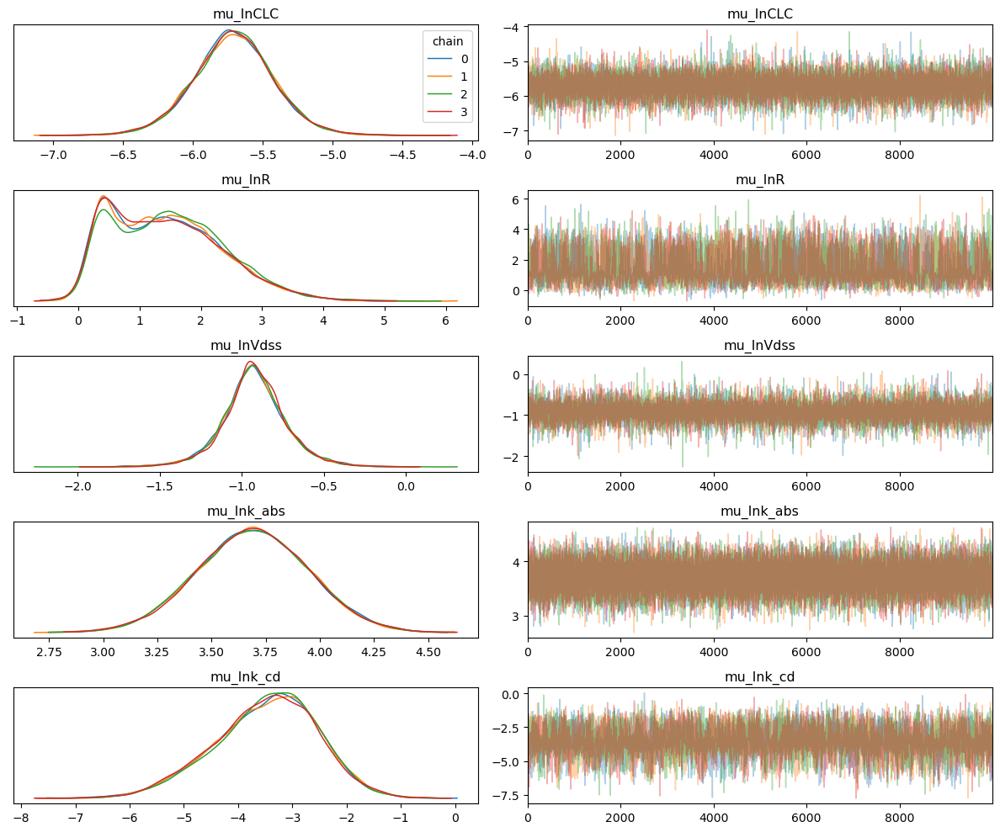

In [15]:
trace_model = pfas_male
with trace_model.model:
    if trace_model.model_structure == 'hierarchical':
        az.plot_trace(trace_model._trace, var_names=['^mu_ln'], filter_vars='regex', compact=False, legend=True)
    else:
        az.plot_trace(trace_model._trace, var_names=['^ln(?!conc).*$'], filter_vars='regex', compact=False, legend=True)
    plt.tight_layout()
    plt.savefig('../ppc/traceplots/%s_%s_%s_traceplot.png'% (trace_model.chemical, trace_model.species, trace_model.sex))

../species_fits/rat/PFDA/PFDA_Male_rat_CLC_2cmpt.pdf
Running PPC...
setting params...
sampling...


Sampling: [conc_sample]


Output()

Calculating stats...
Running PPC...
setting params...
sampling...


Sampling: [conc_sample]


Output()

Calculating stats...
Running PPC...
setting params...
sampling...


Sampling: [conc_sample]


Output()

Calculating stats...
Running PPC...
setting params...
sampling...


Sampling: [conc_sample]


Output()

Calculating stats...
Running PPC...
setting params...
sampling...


Sampling: [conc_sample]


Output()

Calculating stats...
Running PPC...
setting params...
sampling...


Sampling: [conc_sample]


Output()

Calculating stats...
Running PPC...
setting params...
sampling...


Sampling: [conc_sample]


Output()

Calculating stats...


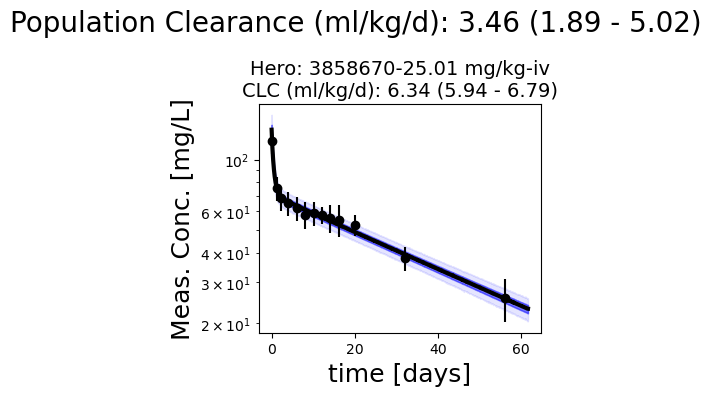

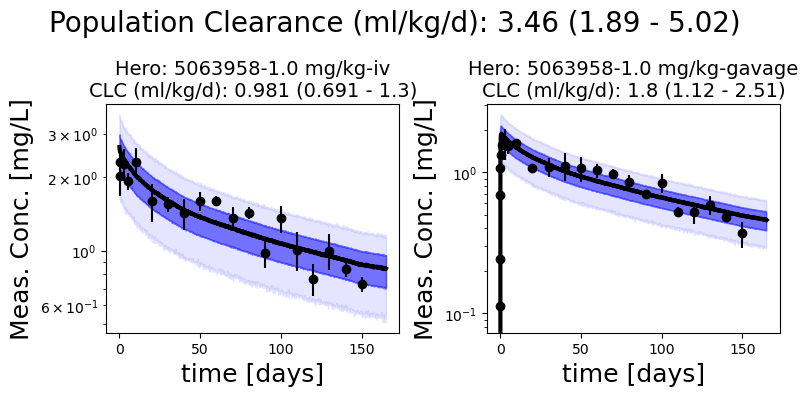

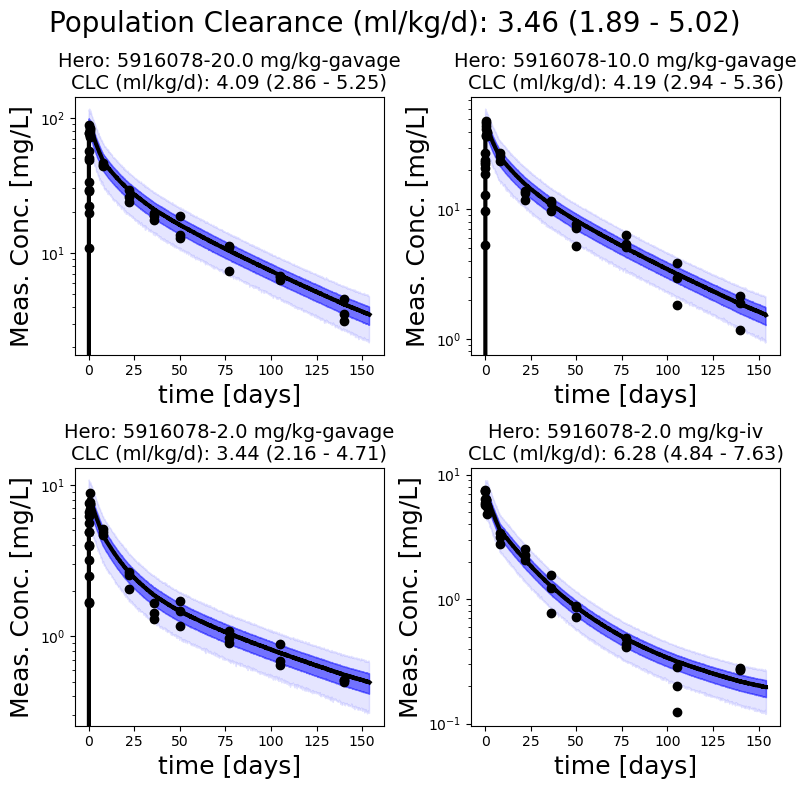

In [16]:
pfas_male.plot_all_studies()

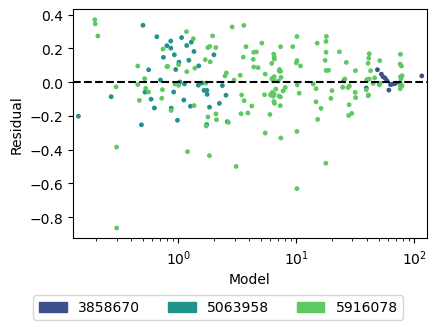

In [17]:
pfas_male.plot_residuals()

### PK stats

In [18]:
#male_draws = pfas_male.generate_samples(var_names = ['CLC [pop]', 'Vc [pop]', 'mu_k_dc', 'mu_k_cd', 'mu_k_abs', 'mu_fa'])
#male_draws.to_csv('../posterior_pk/PFDA_Male_Rat_20231214.csv')

In [19]:
az.summary(pfas_male._trace, var_names='mu_fa', kind='stats', hdi_prob=0.9, round_to=5)

,mean,sd,hdi_5%,hdi_95%
mu_fa,0.84905,0.11456,0.6908,0.99901


In [20]:
pfas_male.get_pk_stats()

,mean,sd,hdi_5%,hdi_95%
CLC [pop],0.00346,0.00105,0.00189,0.00502
Vc [pop],0.31174,0.07661,0.19205,0.42688
Vdss [pop],0.40554,0.08372,0.27404,0.53170
abs_halft [pop],0.01788,0.00471,0.01024,0.02493
fa [pop],0.84905,0.11456,0.69080,0.99901
halft [pop],88.40460,33.13843,40.92991,134.55686
halft_alpha [pop],7.81266,9.89779,0.04269,21.96453
halft_beta [pop],97.57721,45.39684,40.46221,152.33201


## Female

In [21]:
%%time
pfas_female_data = pfas_tmp.get_processed_data(chemical=chemical, sex='Female', species='rat')
pfas_female_data.head()

Hero ID available:  [3858670 5063958 5916078]
dropping duplicated column
Hero ID used:  [3858670 5063958 5916078]
CPU times: user 568 ms, sys: 1.99 ms, total: 570 ms
Wall time: 571 ms


,hero_id,study_id,animal_id,N_animals,BW,BW_units,BW_init,BW_init_units,species,strain,dose,dose_units,time,time_units,conc_mean,conc_sd,standard_error,conc_units,route,matrix,sex,dtxsid,source,initial_age,initial_age_units,initial_weight,initial_weight_units,n,author,preferred_name,pfas_abbrev,casrn,iupac_name,mapped_dtxsid,n_times,idx1,idx2,idx3,time_cor,dose_cor,time_course,BW_cor,conc_mean_cor,conc_sd_cor,Dss,lod,censored,route_idx,sex_idx,lnconc_sd,lnconc_mean,cv,aidx,dose_mg,dataset_str
0,3858670,6,-1,1,-1.0,NaN,0.388745,NaN,rat,wistar,48.64,umol/kg,3.793008,hour,291.921478,34.554122,0,nmol/ml,iv,plasma,Female,DTXSID3031860,Figure 1B,24.0,months,NaN,Not Reported,3,Ohmori,Perfluorononanoic acid,PFDA,375-95-1,"2,2,3,3,4,4,5,5,6,6,7,7,8,8,9,9,10,10,10-nonad...",DTXSID3031860,18,0,0,0,0.158042,25.005143,730.655642,0.388745,150.072745,17.763790,0.0,-1,0,0,1,0.117956,5.004163,0.118368,False,9.720623,3858670-25.01 mg/kg-iv
1,3858670,6,-1,1,-1.0,NaN,0.388745,NaN,rat,wistar,48.64,umol/kg,11.233837,hour,205.313027,43.428181,0,nmol/ml,iv,plasma,Female,DTXSID3031860,Figure 1B,24.0,months,NaN,Not Reported,3,Ohmori,Perfluorononanoic acid,PFDA,375-95-1,"2,2,3,3,4,4,5,5,6,6,7,7,8,8,9,9,10,10,10-nonad...",DTXSID3031860,18,0,0,0,0.468077,25.005143,730.965677,0.388820,105.548553,22.325820,0.0,-1,0,0,1,0.209212,4.637286,0.211522,False,9.720623,3858670-25.01 mg/kg-iv
2,3858670,6,-1,1,-1.0,NaN,0.388745,NaN,rat,wistar,48.64,umol/kg,16.170191,hour,158.948994,13.229589,0,nmol/ml,iv,plasma,Female,DTXSID3031860,Figure 1B,24.0,months,NaN,Not Reported,3,Ohmori,Perfluorononanoic acid,PFDA,375-95-1,"2,2,3,3,4,4,5,5,6,6,7,7,8,8,9,9,10,10,10-nonad...",DTXSID3031860,18,0,0,0,0.673758,25.005143,731.171358,0.388870,81.713452,6.801147,0.0,-1,0,0,1,0.083088,4.399767,0.083232,False,9.720623,3858670-25.01 mg/kg-iv
3,3858670,6,-1,1,-1.0,NaN,0.388745,NaN,rat,wistar,48.64,umol/kg,23.774355,hour,129.094180,17.607677,0,nmol/ml,iv,plasma,Female,DTXSID3031860,Figure 1B,24.0,months,NaN,Not Reported,3,Ohmori,Perfluorononanoic acid,PFDA,375-95-1,"2,2,3,3,4,4,5,5,6,6,7,7,8,8,9,9,10,10,10-nonad...",DTXSID3031860,18,0,0,0,0.990598,25.005143,731.488198,0.388947,66.365510,9.051860,0.0,-1,0,0,1,0.135766,4.185961,0.136394,False,9.720623,3858670-25.01 mg/kg-iv
4,3858670,6,-1,1,-1.0,NaN,0.388745,NaN,rat,wistar,48.64,umol/kg,52.376175,hour,113.520747,9.448521,0,nmol/ml,iv,plasma,Female,DTXSID3031860,Figure 1B,24.0,months,NaN,Not Reported,3,Ohmori,Perfluorononanoic acid,PFDA,375-95-1,"2,2,3,3,4,4,5,5,6,6,7,7,8,8,9,9,10,10,10-nonad...",DTXSID3031860,18,0,0,0,2.182341,25.005143,732.679941,0.389237,58.359427,4.857352,0.0,-1,0,0,1,0.083088,4.063169,0.083232,False,9.720623,3858670-25.01 mg/kg-iv


### Run the models

#### 1-Compartment model

In [22]:
pfas_female_1cmpt = PyPKMC(pfas_female_data, time_label='time_cor', y_obs_label='conc_mean_cor', sd_obs_label='conc_sd_cor',
                         route_label='route_idx', dose_label='dose_mg', BW_label='BW_cor', 
                         study_label='hero_id', dataset_label='dataset_str', indiv_label='aidx',
                         CLC_prior = CLC_prior, Vdss_prior = Vdss_prior)
pfas_female_1cmpt.sample(model_type='1-compartment', target_accept=0.99, nuts_sampler='numpyro',
                   load_trace=load_trace, tune=10000, draws=5000, likelihood='Lognormal', sample_prior=True, sample_posterior=True)

PFDA_Female_rat_1cmpt
hierarchical model, 1-compartment
Checking metrics...
Pass all metrics = True
Assign pareto...


/data/tzurlind/pkgs/miniforge3/lib/python3.12/site-packages/arviz/plots/traceplot.py:223: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (45), generating only 20 plots
  warnings.warn(
/data/tzurlind/pkgs/miniforge3/lib/python3.12/site-packages/arviz/stats/density_utils.py:488: UserWarning: Your data appears to have a single value or no finite values
  warnings.warn("Your data appears to have a single value or no finite values")


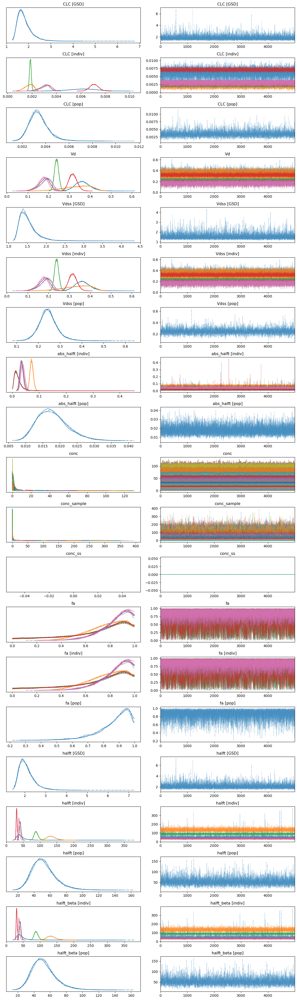

In [23]:
with pfas_female_1cmpt.model:
    az.plot_trace(pfas_female_1cmpt._trace)
    plt.tight_layout()

conc_indiv
conc_summary


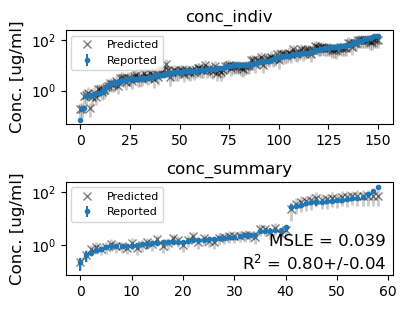

In [24]:
pfas_female_1cmpt.plot_data_ppc(group='posterior')

#### 2-Compartment model

In [25]:
pfas_female_2cmpt = PyPKMC(pfas_female_data, time_label='time_cor', y_obs_label='conc_mean_cor', sd_obs_label='conc_sd_cor',
                         route_label='route_idx', dose_label='dose_mg', BW_label='BW_cor', 
                         study_label='hero_id', dataset_label='dataset_str', indiv_label='aidx', Rkcd_SD_prior = 1, #abs_SD_prior = 0.5,
                         CLC_prior = CLC_prior, Vdss_prior = Vdss_prior)
pfas_female_2cmpt.sample(model_type='2-compartment', target_accept=0.99, nuts_sampler='numpyro', 
                   load_trace=load_trace, tune=12000, draws=5000, likelihood='Lognormal', sample_prior=True, sample_posterior=True)

PFDA_Female_rat_2cmpt
hierarchical model, 2-compartment
Checking metrics...
Pass all metrics = True
Assign pareto...


/data/tzurlind/pkgs/miniforge3/lib/python3.12/site-packages/arviz/plots/traceplot.py:223: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (83), generating only 20 plots
  warnings.warn(


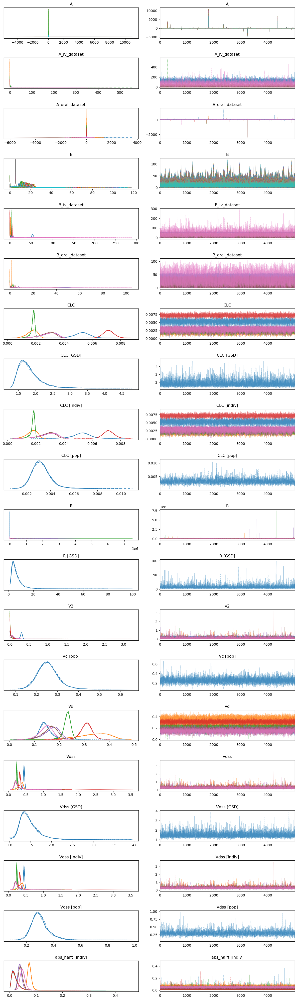

In [26]:
with pfas_female_2cmpt.model:
    az.plot_trace(pfas_female_2cmpt._trace)
    plt.tight_layout()

/data/tzurlind/pkgs/miniforge3/lib/python3.12/site-packages/arviz/plots/traceplot.py:223: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (83), generating only 20 plots
  warnings.warn(


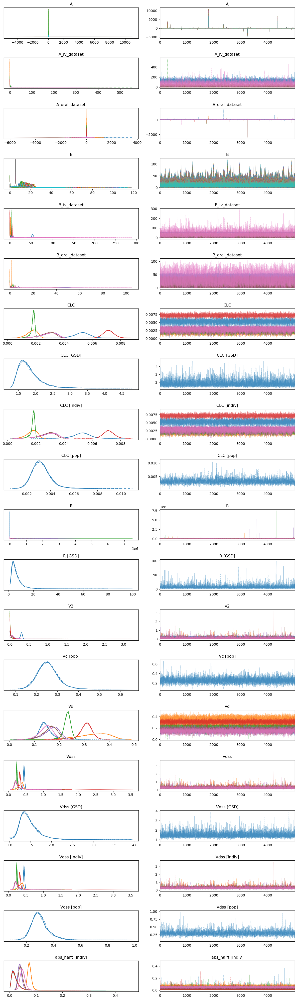

In [27]:
with pfas_female_2cmpt.model:
    az.plot_trace(pfas_female_2cmpt._trace)
    plt.tight_layout()

conc_indiv
conc_summary


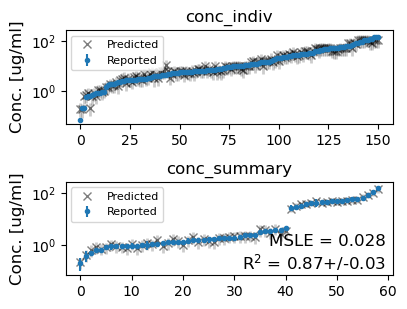

In [28]:
pfas_female_2cmpt.plot_data_ppc(group='posterior')

#### Compare models

/data/tzurlind/pkgs/miniforge3/lib/python3.12/site-packages/arviz/stats/stats.py:789: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(
/data/tzurlind/pkgs/miniforge3/lib/python3.12/site-packages/arviz/stats/stats.py:789: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
2_compartment,0,-514.698866,45.895922,0.000000,1.000000e+00,29.762421,0.000000,True,log
1_compartment,1,-536.481947,38.072955,21.783081,1.747935e-12,30.428273,6.557787,True,log


<Axes: title={'center': 'Model comparison\nhigher is better'}, xlabel='elpd_loo (log)', ylabel='ranked models'>

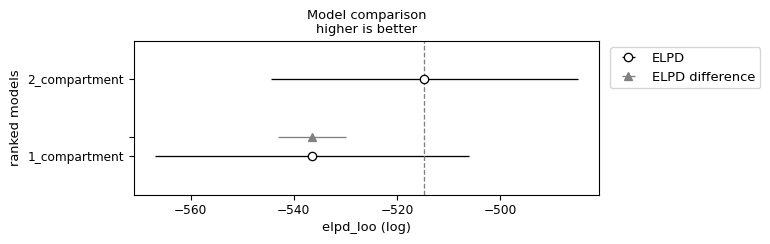

In [29]:
pfas_female_compare = az.compare({"1_compartment": pfas_female_1cmpt._trace, "2_compartment": pfas_female_2cmpt._trace},
                           var_name="combined",ic='loo')
display(pfas_female_compare)
az.plot_compare(pfas_female_compare, insample_dev=False)

#### Define winning model

In [30]:
pfas_female = pfas_female_2cmpt
print(pfas_female.N_divergences)
print(f'Pass all metrics = {pfas_female.pass_all_metrics}')

0
Pass all metrics = True


### Posterior predictive check on winning model

conc_indiv
conc_summary
conc_indiv
conc_summary


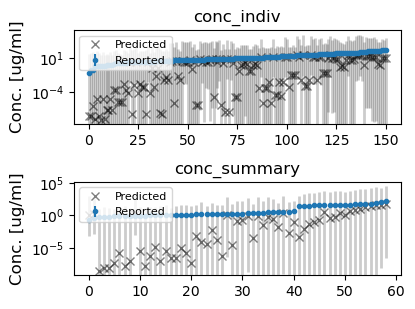

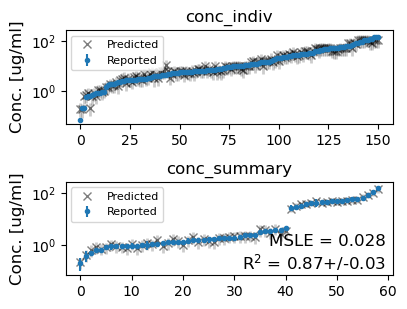

In [31]:
pfas_female.plot_data_ppc(group='prior', savefig=True)
pfas_female.plot_data_ppc(group='posterior', savefig=True)

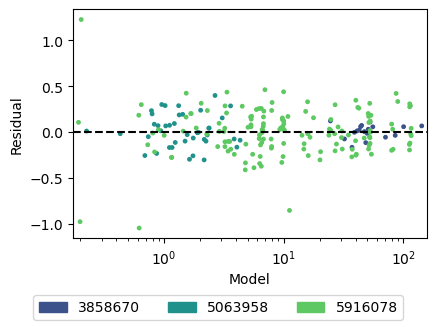

In [32]:
pfas_female.plot_residuals() 

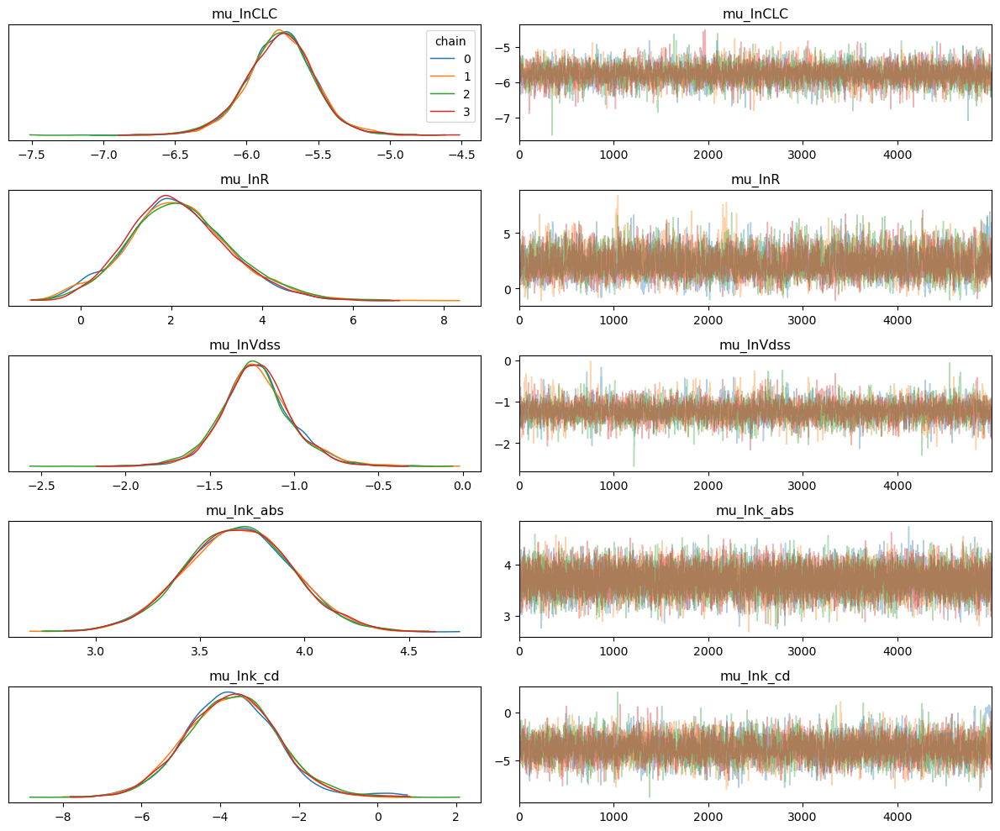

In [33]:
trace_model = pfas_female
with trace_model.model:
    if trace_model.model_structure == 'hierarchical':
        az.plot_trace(trace_model._trace, var_names=['^mu_ln'], filter_vars='regex', compact=False, legend=True)
    else:
        az.plot_trace(trace_model._trace, var_names=['^ln(?!conc).*$'], filter_vars='regex', compact=False, legend=True)
    plt.tight_layout()
    plt.savefig('../ppc/traceplots/%s_%s_%s_traceplot.png'% (trace_model.chemical, trace_model.species, trace_model.sex))

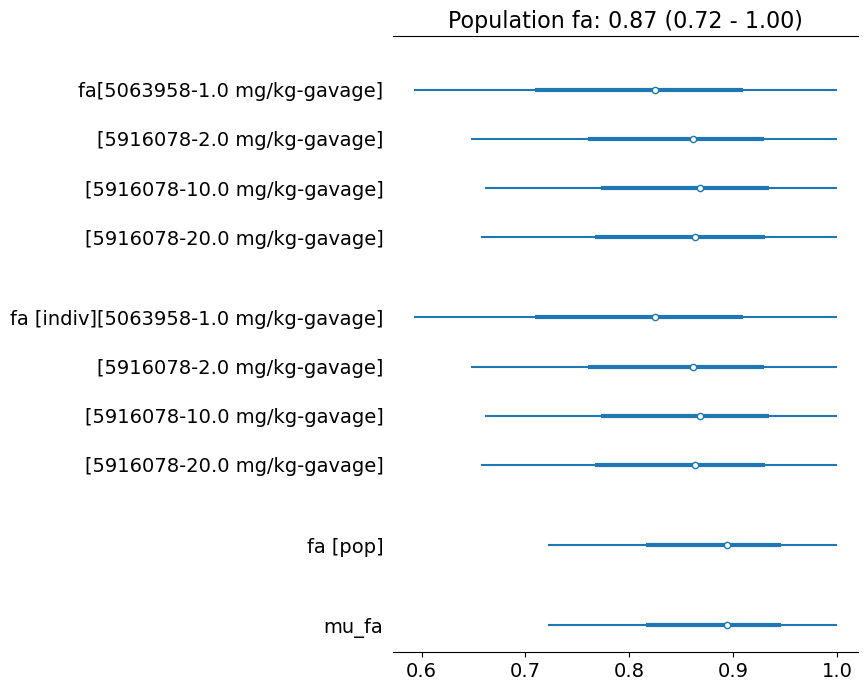

In [34]:
pfas_female.plot_fa()

../species_fits/rat/PFDA/PFDA_Female_rat_CLC_2cmpt.pdf
Running PPC...
setting params...
sampling...


Sampling: [conc_sample]


Output()

Calculating stats...
Running PPC...
setting params...
sampling...


Sampling: [conc_sample]


Output()

Calculating stats...
Running PPC...
setting params...
sampling...


Sampling: [conc_sample]


Output()

Calculating stats...
Running PPC...
setting params...
sampling...


Sampling: [conc_sample]


Output()

Calculating stats...
Running PPC...
setting params...
sampling...


Sampling: [conc_sample]


Output()

Calculating stats...
Running PPC...
setting params...
sampling...


Sampling: [conc_sample]


Output()

Calculating stats...
Running PPC...
setting params...
sampling...


Sampling: [conc_sample]


Output()

Calculating stats...


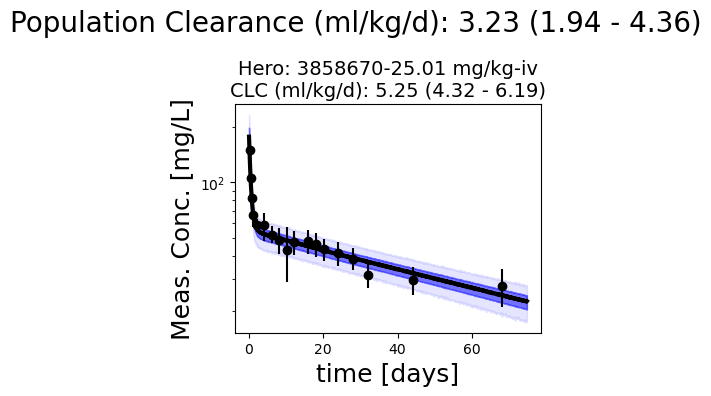

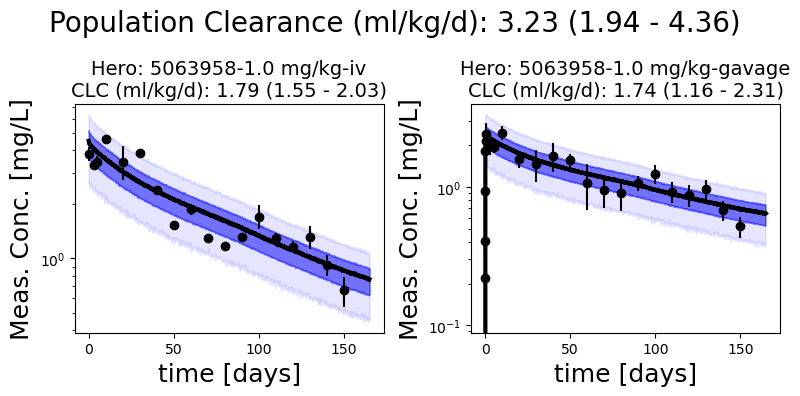

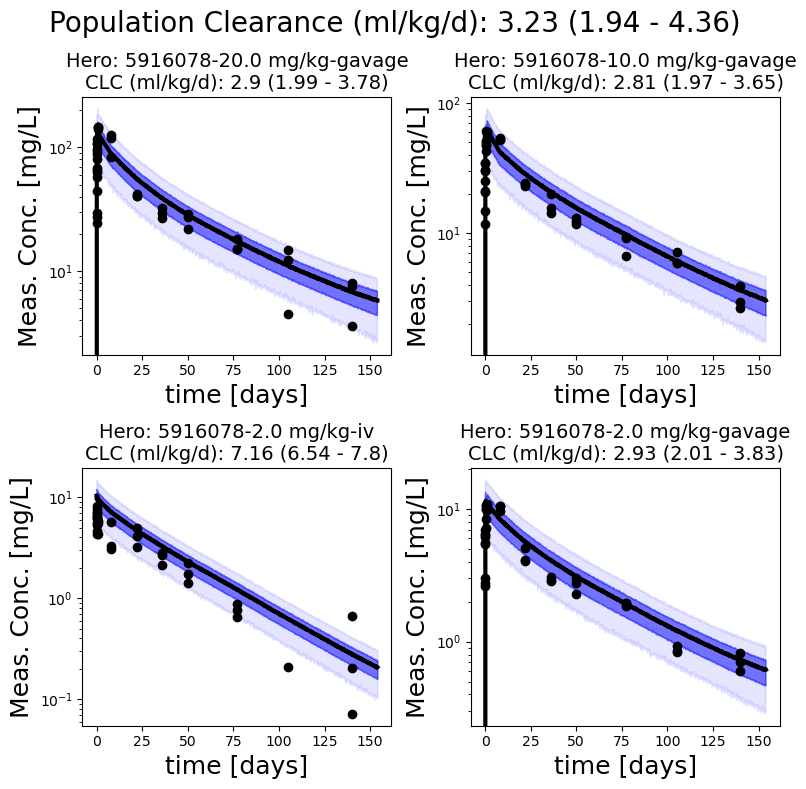

In [35]:
pfas_female.plot_all_studies()

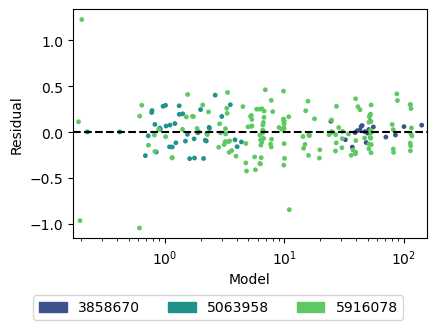

In [36]:
pfas_female.plot_residuals()

### PK stats

In [37]:
indiv_summary = pfas_female.get_pk_stats(level='indiv', vol_units='ml')
hero_id = '3858670'
pk_parm = 'CLC'
dose = '10.0 mg/kg'
#hero_fits = indiv_summary.loc[[x for x in indiv_summary.index if (hero_id in x) & (pk_parm in x)]]
#hero_fits = indiv_summary.loc[[x for x in indiv_summary.index if (hero_id in x)]]# & (dose in x)]]
hero_fits = indiv_summary.loc[[x for x in indiv_summary.index if (pk_parm in x)]]# & (dose in x)]]
for ind, row in hero_fits.iterrows():
    print(ind, "%0.4g (%0.4g - %0.4g)"%(row['mean'], row['hdi_5%'], row['hdi_95%']))

CLC [indiv][3858670-25.01 mg/kg-iv] 5.25 (4.32 - 6.19)
CLC [indiv][5063958-1.0 mg/kg-gavage] 1.74 (1.16 - 2.31)
CLC [indiv][5063958-1.0 mg/kg-iv] 1.79 (1.56 - 2.03)
CLC [indiv][5916078-2.0 mg/kg-iv] 7.16 (6.55 - 7.8)
CLC [indiv][5916078-2.0 mg/kg-gavage] 2.93 (2.01 - 3.84)
CLC [indiv][5916078-10.0 mg/kg-gavage] 2.82 (1.96 - 3.66)
CLC [indiv][5916078-20.0 mg/kg-gavage] 2.9 (1.99 - 3.78)


In [38]:
#female_draws = pfas_female.generate_samples(var_names = ['CLC [pop]', 'Vc [pop]', 'mu_k_dc', 'mu_k_cd', 'mu_k_abs', 'mu_fa'])
#female_draws.to_csv('../posterior_pk/PFDA_Female_Rat_20231214.csv')

In [39]:
az.summary(pfas_female._trace, var_names='mu_fa', kind='stats', hdi_prob=0.9, round_to=5)

,mean,sd,hdi_5%,hdi_95%
mu_fa,0.86683,0.10659,0.72209,0.99958


In [40]:
pfas_female.get_pk_stats()

,mean,sd,hdi_5%,hdi_95%
CLC [pop],0.00322,0.00080,0.00194,0.00436
Vc [pop],0.25358,0.04969,0.17271,0.33043
Vdss [pop],0.30071,0.06712,0.19868,0.40424
abs_halft [pop],0.01805,0.00472,0.01072,0.02537
fa [pop],0.86683,0.10659,0.72209,0.99958
halft [pop],68.77509,24.93228,33.55010,102.76089
halft_alpha [pop],6.89247,9.97921,0.00073,20.19779
halft_beta [pop],77.62819,57.08494,31.93432,117.68278


# Mouse

No mouse data available for PFDA

# Primate
No primate data available for PFDA